In [3]:
import matplotlib.pyplot as plt
import numpy as np
from datasets import load_dataset

# w0 = HFDataset.load_from_disk("data/w0/test")
w1 = load_dataset("Birr001/RGB-MNIST")['test']
print(w1)
# for feature in ['z', 'ode_trajectory', 'y', 'X', 'r', 'g', 'b', 'digit']:
#     print(f"{feature}: {np.array(w1[feature]).shape}")

Dataset({
    features: ['z', 'ode_trajectory', 'y', 'X', 'r', 'g', 'b', 'digit'],
    num_rows: 10000
})


In [4]:
# TSNE
from sklearn.manifold import TSNE

tsne_params = {
    "n_components": 2,
    "perplexity": 1000,
    "max_iter": 5000,
    "random_state": 42,
    "learning_rate": "auto",
    "init": "pca",
}

# Perform tsne to reduce embeddings to 2D
tsne = TSNE(**tsne_params)
embeddings = {
    "vae": tsne.fit_transform(np.array(w1["z"])),
    "cond": tsne.fit_transform(np.array(w1["ode_trajectory"])[:, -1]),
}

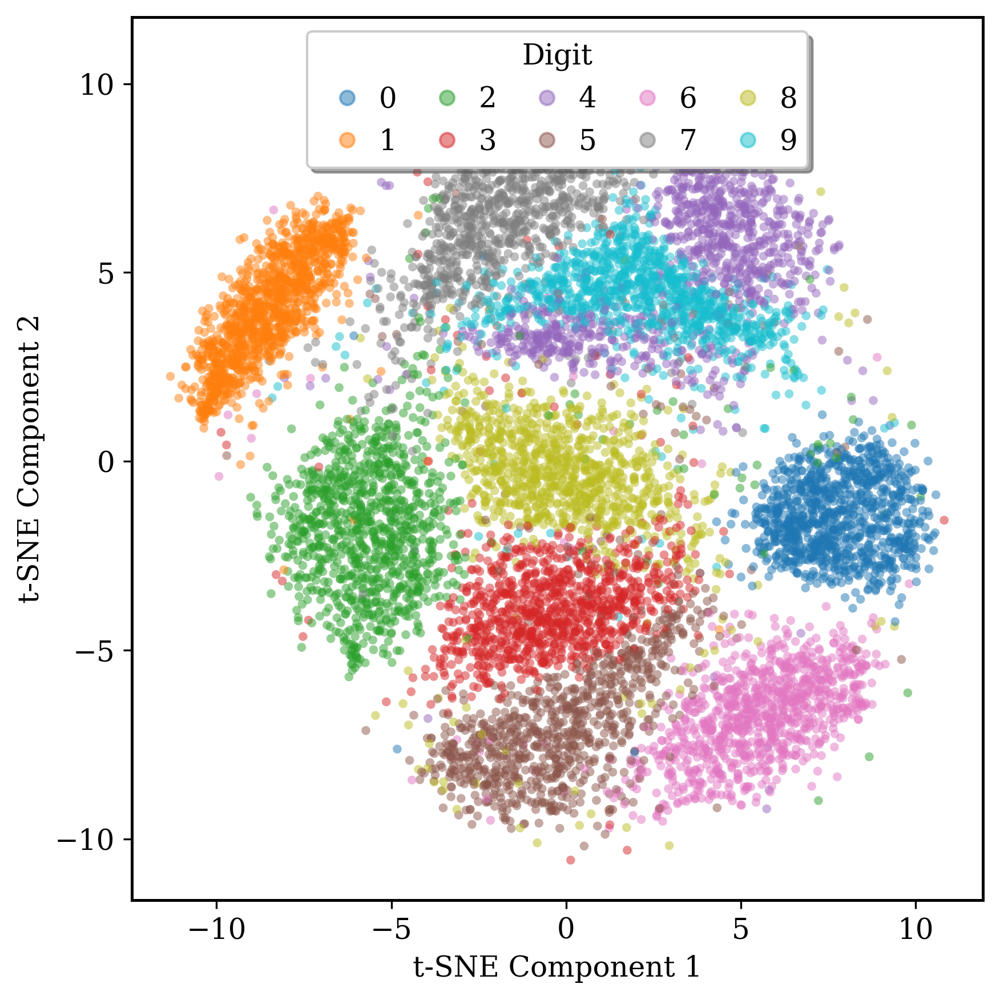

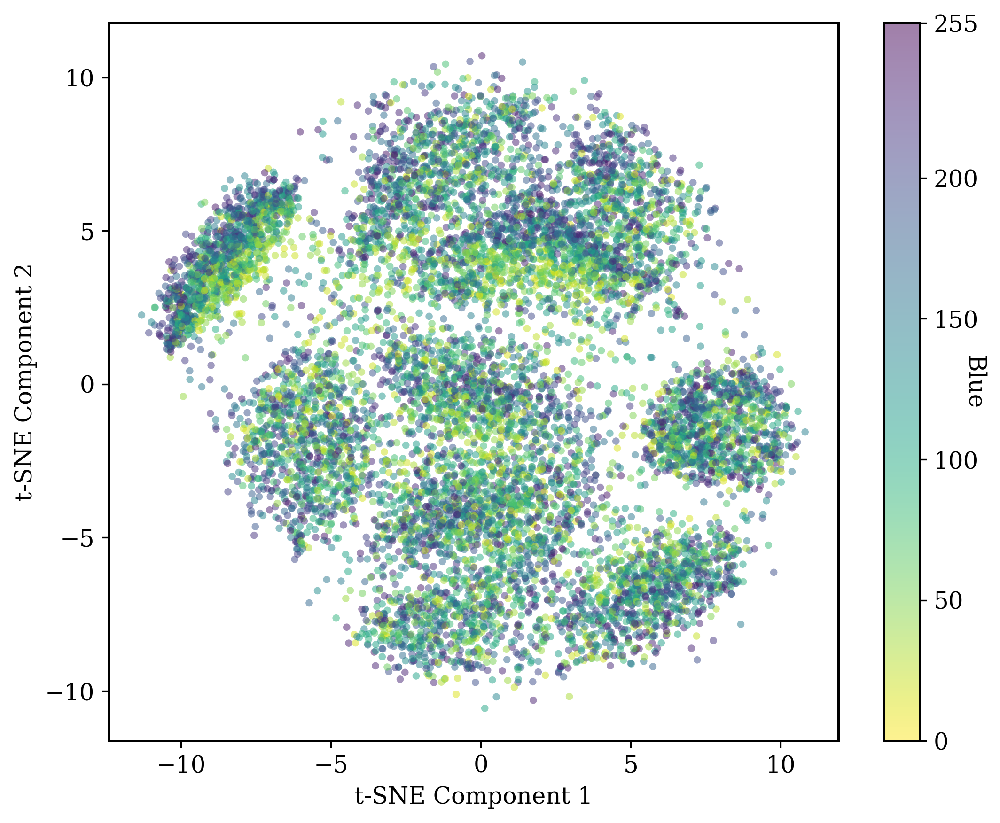

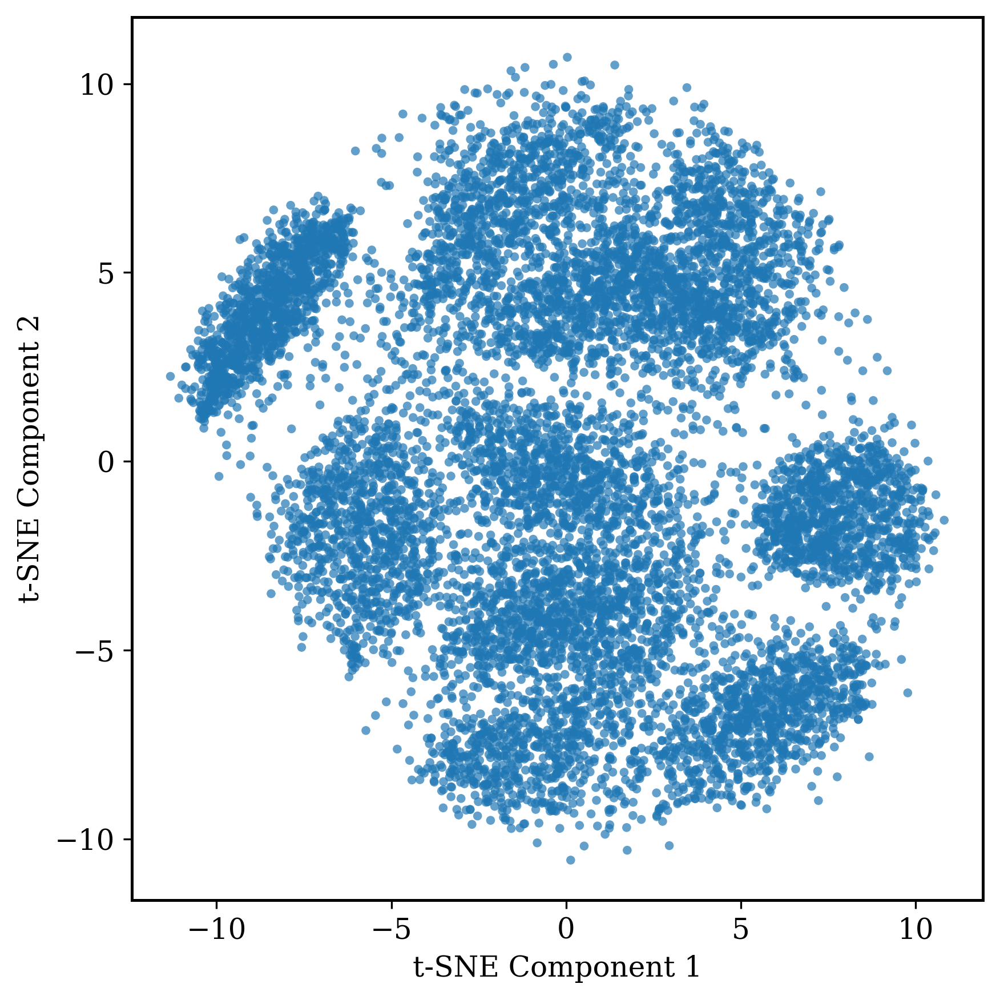

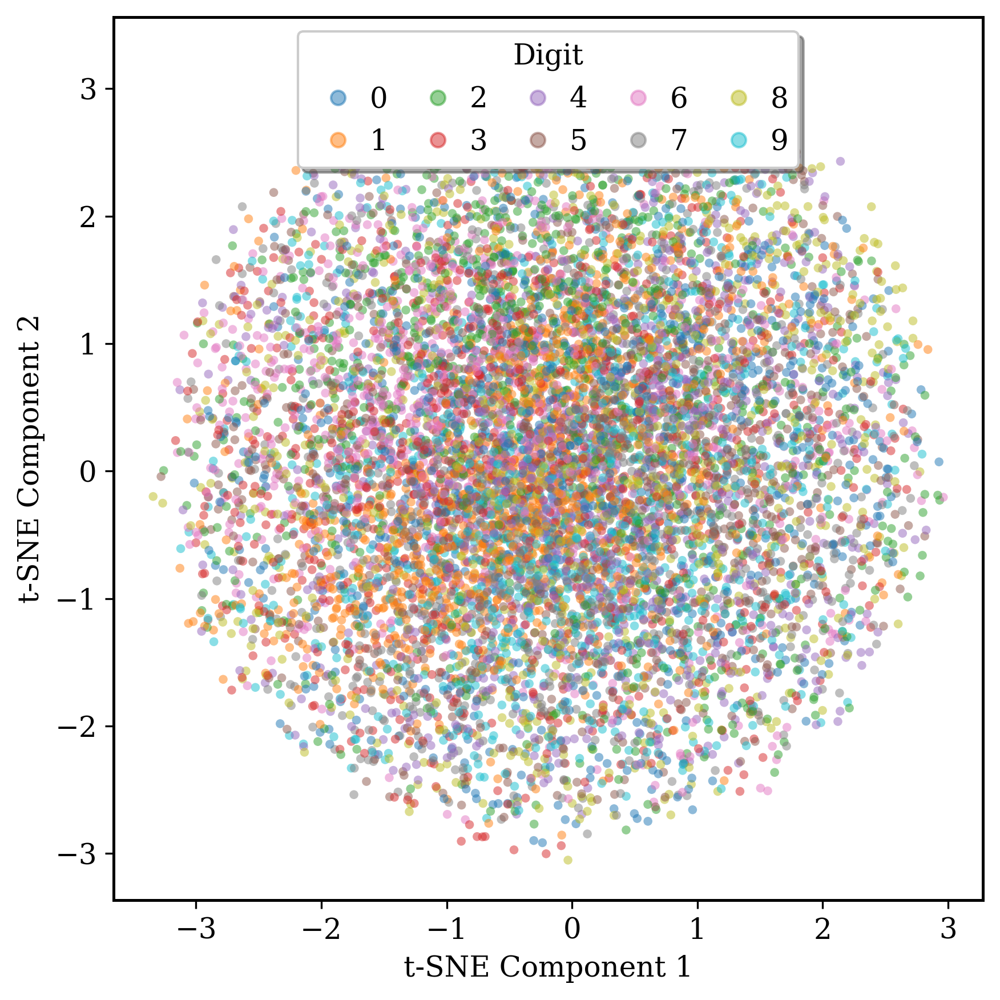

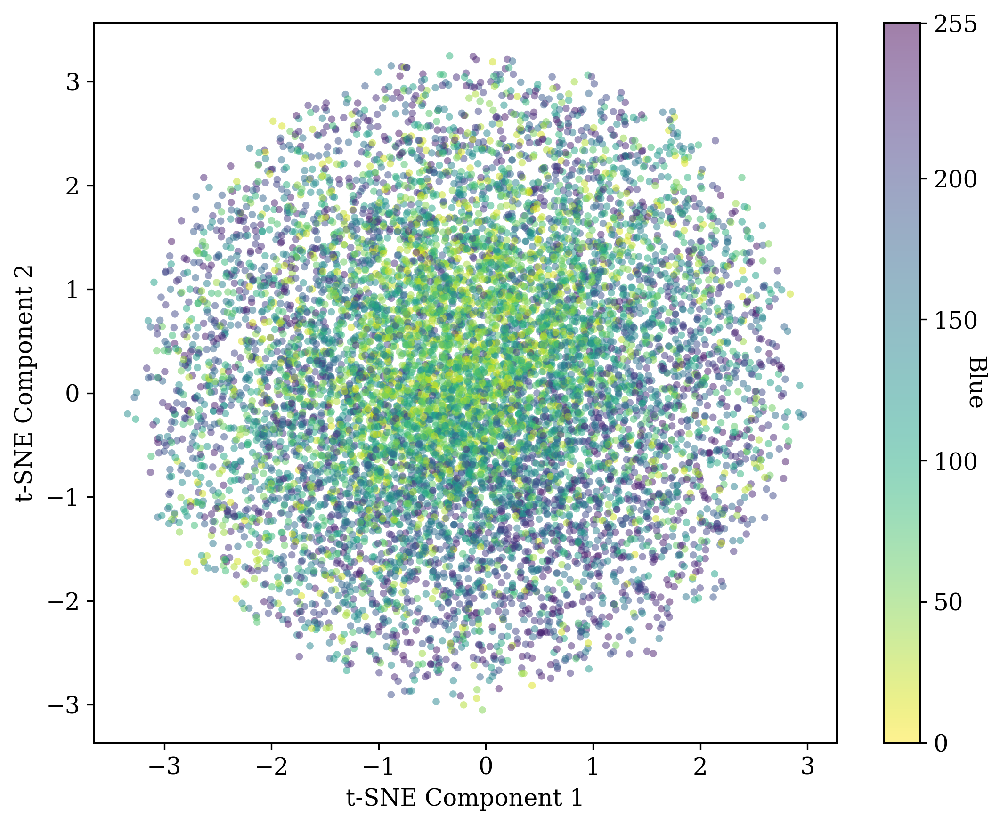

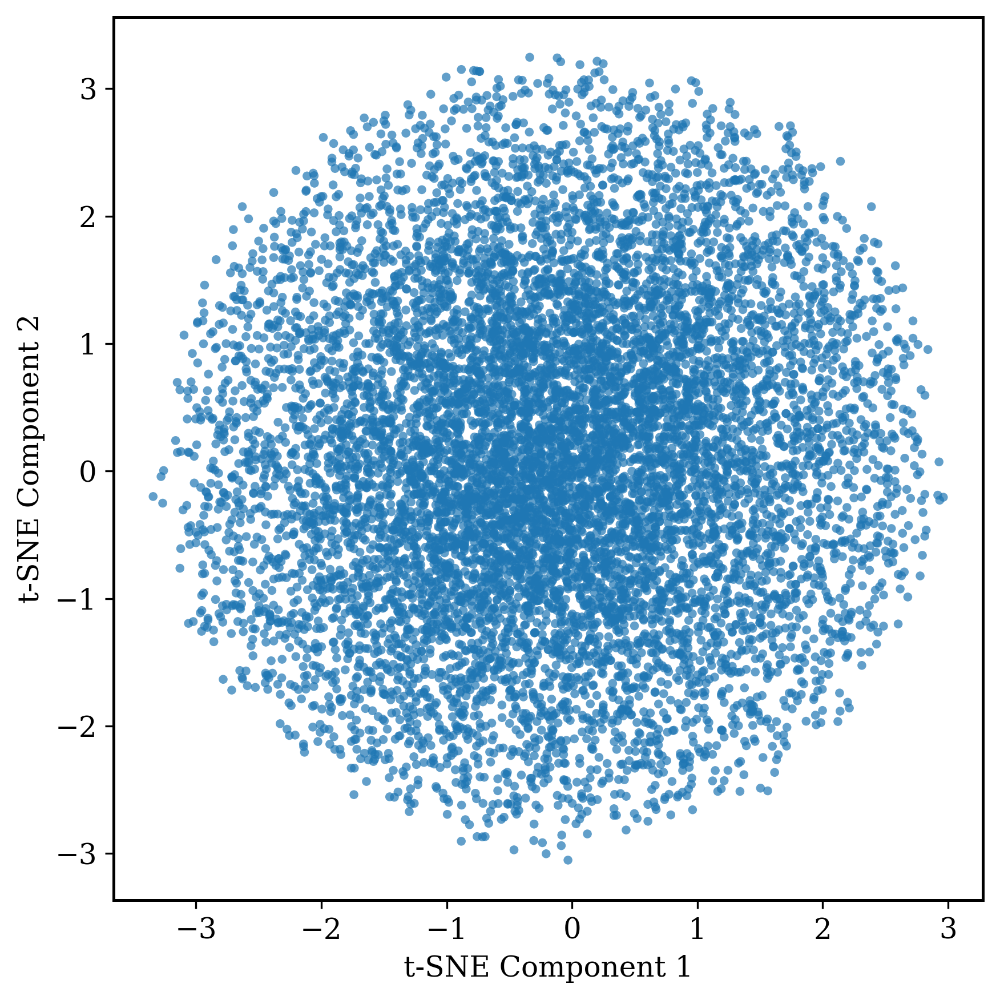

In [5]:
plt.style.use("default")
plt.rcParams.update(
    {
        "font.size": 12,
        "font.family": "serif",
        "axes.linewidth": 1.2,
        "grid.alpha": 0.3,
        "figure.dpi": 300,
    }
)


def scatter_plot(data, feature):
    if feature in ["digit", None]:
        fig, ax = plt.subplots(figsize=(6, 6))
        if feature == "digit":
            scatter = ax.scatter(
                data[:, 0],
                data[:, 1],
                c=np.array(w1[feature]),
                cmap="tab10",
                alpha=0.5,
                s=14,
                edgecolors="none",
            )
            ax.legend(
                *scatter.legend_elements(),
                title="Digit",
                loc="upper center",
                frameon=True,
                fancybox=True,
                shadow=True,
                ncol=5,
                columnspacing=0.8,
                handletextpad=0.1,
            )
        else:
            scatter = ax.scatter(
                data[:, 0], data[:, 1], alpha=0.7, s=14, edgecolors="none"
            )

        ax.set_xlabel("t-SNE Component 1")
        ax.set_ylabel("t-SNE Component 2")
        plt.tight_layout()
        #plt.savefig(f"figs/tsne_{name}_{feature!s}_sample.pdf", bbox_inches="tight")
        plt.show()

    elif feature in ["r", "g", "b"]:
        fig, ax = plt.subplots(figsize=(7.5, 6))
        scatter = ax.scatter(
            data[:, 0],
            data[:, 1],
            c=np.array(w1[feature]) * 255 // 1,
            cmap="viridis_r",
            alpha=0.5,
            s=14,
            edgecolors="none",
            vmin=0,
            vmax=255,
        )
        cbar = ax.figure.colorbar(scatter, ax=ax)
        cbar.ax.set_ylabel("Blue", rotation=-90, y=0.5, x=1.0)
        cbar.set_ticks([0, 50, 100, 150, 200, 255])
        ax.set_xlabel("t-SNE Component 1")
        ax.set_ylabel("t-SNE Component 2")
        plt.tight_layout()
        #plt.savefig(f"./tsne_{name}_{feature}_sample.pdf", bbox_inches="tight")
        plt.show()

    return scatter


# Plot the 2D tsne projection, colored by b_values
for name in ["vae", "cond"]:
    for feature in ["digit", "b", None]:
        data = embeddings[name]
        scatter = scatter_plot(data, feature)